In [726]:
import pandas as pd
from sklearn.preprocessing import LabelEncoder
from sklearn.ensemble import IsolationForest
import numpy as np
import matplotlib.pyplot as plt
import datetime
import seaborn as sns
%matplotlib inline

In [727]:
def dateparse (time_in_secs):    
    return datetime.datetime.fromtimestamp(float(time_in_secs))

In [728]:
#df = pd.read_csv('export_soffico_masterthesis.csv', sep=';', parse_dates=True,date_parser=dateparse)
#df = pd.read_csv('export_soffico_masterthesis_2.csv', sep=';', parse_dates=True,date_parser=dateparse)
df = pd.read_csv('export_soffico_masterthesis_203.csv', sep=';', parse_dates=True,date_parser=dateparse)

In [729]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 551175 entries, 0 to 551174
Data columns (total 4 columns):
 #   Column            Non-Null Count   Dtype 
---  ------            --------------   ----- 
 0   PRS_START_TIME    551175 non-null  object
 1   PRS_END_TIME      551175 non-null  object
 2   PRS_STATE         551175 non-null  int64 
 3   PRS_BUSINESS_KEY  551175 non-null  object
dtypes: int64(1), object(3)
memory usage: 16.8+ MB


In [730]:
df.head()

,PRS_START_TIME,PRS_END_TIME,PRS_STATE,PRS_BUSINESS_KEY
0,2021-09-17 14:33:01.713,2021-09-17 14:33:01.727,3,"nodevalue: 24.878626, nodename: TempIR_FStr_Li..."
1,2021-09-17 14:33:01.713,2021-09-17 14:33:01.727,3,"nodevalue: 25.461386, nodename: TempIR_LStr_Li..."
2,2021-09-17 14:33:01.713,2021-09-17 14:33:01.727,3,"nodevalue: 26.012161, nodename: TempIR_FStr_Li..."
3,2021-09-17 14:33:01.713,2021-09-17 14:33:01.743,3,"nodevalue: 24.235302, nodename: TempIR_FStr_Li..."
4,2021-09-17 14:33:01.727,2021-09-17 14:33:01.743,3,"nodevalue: 25.300138, nodename: TempIR_FStr_Li..."


In [731]:
df = df.join(df['PRS_BUSINESS_KEY'].str.split(', ', 2, expand=True).rename( 
    columns={0:'nodevalue', 1:'nodename', 2:'sourcetimestamp'}))



In [732]:
df.head()

,PRS_START_TIME,PRS_END_TIME,PRS_STATE,PRS_BUSINESS_KEY,nodevalue,nodename,sourcetimestamp
0,2021-09-17 14:33:01.713,2021-09-17 14:33:01.727,3,"nodevalue: 24.878626, nodename: TempIR_FStr_Li...",nodevalue: 24.878626,nodename: TempIR_FStr_Linie4,sourcetimestamp: 2021-09-17T12:33:01.417Z
1,2021-09-17 14:33:01.713,2021-09-17 14:33:01.727,3,"nodevalue: 25.461386, nodename: TempIR_LStr_Li...",nodevalue: 25.461386,nodename: TempIR_LStr_Linie3,sourcetimestamp: 2021-09-17T12:33:01.417Z
2,2021-09-17 14:33:01.713,2021-09-17 14:33:01.727,3,"nodevalue: 26.012161, nodename: TempIR_FStr_Li...",nodevalue: 26.012161,nodename: TempIR_FStr_Linie1,sourcetimestamp: 2021-09-17T12:33:01.416Z
3,2021-09-17 14:33:01.713,2021-09-17 14:33:01.743,3,"nodevalue: 24.235302, nodename: TempIR_FStr_Li...",nodevalue: 24.235302,nodename: TempIR_FStr_Linie3,sourcetimestamp: 2021-09-17T12:33:01.417Z
4,2021-09-17 14:33:01.727,2021-09-17 14:33:01.743,3,"nodevalue: 25.300138, nodename: TempIR_FStr_Li...",nodevalue: 25.300138,nodename: TempIR_FStr_Linie2,sourcetimestamp: 2021-09-17T12:33:01.417Z


In [733]:
#split columns
#df = df.join(df['PRS_BUSINESS_KEY'].str.split(', ', 2, expand=True).rename(columns={0:'nodevalue', 1:'nodename', 2:'sourcetimestamp'}))

#correct column content
df["nodevalue"] = df['nodevalue'].str.replace('nodevalue: ', '')
df["nodevalue"] = df['nodevalue'].str.replace('true', '-1')
df["nodevalue"] = df['nodevalue'].str.replace('false', '-2')
df["nodevalue"] = pd.to_numeric(df["nodevalue"], downcast="float")

df["nodename"] = df['nodename'].str.replace('nodename: ', '')

df["sourcetimestamp"] = df['sourcetimestamp'].str.replace('sourcetimestamp: ', '')
df["sourcetimestamp"] = df['sourcetimestamp'].str.replace('T', ' ')
df["sourcetimestamp"] = df['sourcetimestamp'].str.replace('Z', '')
df["sourcetimestamp"] = pd.to_datetime(df["sourcetimestamp"])

df = df.drop("PRS_BUSINESS_KEY", axis=1)
df = df.drop("PRS_STATE", axis=1)

df.head()

,PRS_START_TIME,PRS_END_TIME,nodevalue,nodename,sourcetimestamp
0,2021-09-17 14:33:01.713,2021-09-17 14:33:01.727,24.878626,TempIR_FStr_Linie4,2021-09-17 12:33:01.417
1,2021-09-17 14:33:01.713,2021-09-17 14:33:01.727,25.461386,TempIR_LStr_Linie3,2021-09-17 12:33:01.417
2,2021-09-17 14:33:01.713,2021-09-17 14:33:01.727,26.012161,TempIR_FStr_Linie1,2021-09-17 12:33:01.416
3,2021-09-17 14:33:01.713,2021-09-17 14:33:01.743,24.235302,TempIR_FStr_Linie3,2021-09-17 12:33:01.417
4,2021-09-17 14:33:01.727,2021-09-17 14:33:01.743,25.300138,TempIR_FStr_Linie2,2021-09-17 12:33:01.417


In [734]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 551175 entries, 0 to 551174
Data columns (total 5 columns):
 #   Column           Non-Null Count   Dtype         
---  ------           --------------   -----         
 0   PRS_START_TIME   551175 non-null  object        
 1   PRS_END_TIME     551175 non-null  object        
 2   nodevalue        551175 non-null  float32       
 3   nodename         551175 non-null  object        
 4   sourcetimestamp  551175 non-null  datetime64[ns]
dtypes: datetime64[ns](1), float32(1), object(3)
memory usage: 18.9+ MB


In [735]:
df["PRS_START_TIME"] = pd.to_datetime(df["PRS_START_TIME"])

In [736]:
df["PRS_END_TIME"] = pd.to_datetime(df["PRS_END_TIME"])

In [737]:
df['processtime'] = df['PRS_END_TIME'] - df['PRS_START_TIME']
df['processtime']=df['processtime']/np.timedelta64(1,'ms')

#sourcetimestamp ist UTC, PRS START TIME ist Local
#max 1 sec abweichung

df.head()

,PRS_START_TIME,PRS_END_TIME,nodevalue,nodename,sourcetimestamp,processtime
0,2021-09-17 14:33:01.713,2021-09-17 14:33:01.727,24.878626,TempIR_FStr_Linie4,2021-09-17 12:33:01.417,14.0
1,2021-09-17 14:33:01.713,2021-09-17 14:33:01.727,25.461386,TempIR_LStr_Linie3,2021-09-17 12:33:01.417,14.0
2,2021-09-17 14:33:01.713,2021-09-17 14:33:01.727,26.012161,TempIR_FStr_Linie1,2021-09-17 12:33:01.416,14.0
3,2021-09-17 14:33:01.713,2021-09-17 14:33:01.743,24.235302,TempIR_FStr_Linie3,2021-09-17 12:33:01.417,30.0
4,2021-09-17 14:33:01.727,2021-09-17 14:33:01.743,25.300138,TempIR_FStr_Linie2,2021-09-17 12:33:01.417,16.0


In [738]:
column = df["processtime"]

max_value_nodevalue = df['nodevalue'].nlargest(10)
max_value_processtime = df['processtime'].nlargest(10)
print(max_value_nodevalue)
print(max_value_processtime)

521008    3.000000e+37
521009    3.000000e+37
521010    3.000000e+37
521011    3.000000e+37
521012    3.000000e+37
521013    3.000000e+37
521014    3.000000e+37
521015    3.000000e+37
530804    1.802832e+02
537742    1.757865e+02
Name: nodevalue, dtype: float32
547178    10573.0
90629      8326.0
412494     7980.0
322984     7877.0
504361     7340.0
504363     7340.0
287897     6807.0
520869     5576.0
520875     5576.0
191979     5566.0
Name: processtime, dtype: float64


In [739]:
if 1:
    df = df.drop(521008, axis=0)
    df = df.drop(521009, axis=0)
    df = df.drop(521010, axis=0)
    df = df.drop(521011, axis=0)
    df = df.drop(521012, axis=0)
    df = df.drop(521013, axis=0)
    df = df.drop(521014, axis=0)
    df = df.drop(521015, axis=0)
if 1:
    df = df.drop(547178, axis=0)
    df = df.drop(90629, axis=0)
    df = df.drop(412494, axis=0)
    df = df.drop(322984, axis=0)
    df = df.drop(287897, axis=0)
    
if 0:
    df = df.drop(521820, axis=0)
    df = df.drop(521821, axis=0)
    df = df.drop(521822, axis=0)
    df = df.drop(521823, axis=0)
    df = df.drop(521824, axis=0)
    df = df.drop(521825, axis=0)
    df = df.drop(521826, axis=0)
    df = df.drop(521827, axis=0)
if 0:
    df = df.drop(322822, axis=0)
    df = df.drop(322827, axis=0)
    
max_value_nodevalue = df['nodevalue'].nlargest(10)
max_value_processtime = df['processtime'].nlargest(10)
print(max_value_nodevalue)
print(max_value_processtime)

530804    180.283249
537742    175.786530
536157    175.247360
536248    174.721695
536152    173.088226
536150    169.458664
537749    166.800690
530722    166.715988
530692    166.138748
530699    165.820648
Name: nodevalue, dtype: float32
504361    7340.0
504363    7340.0
520869    5576.0
520875    5576.0
191979    5566.0
146328    2753.0
146329    2257.0
146331    2257.0
146330    2253.0
215050    1650.0
Name: processtime, dtype: float64


In [740]:
dummies = pd.get_dummies(df['nodename'], drop_first=True)
df = pd.concat([df.drop('nodename', axis=1), dummies], axis=1)

In [741]:
df.head()

,PRS_START_TIME,PRS_END_TIME,nodevalue,sourcetimestamp,processtime,Handbetrieb,Produktion,Standby,Stoerung,TempIR_FStr_Linie1,TempIR_FStr_Linie2,TempIR_FStr_Linie3,TempIR_FStr_Linie4,TempIR_LStr_Linie1,TempIR_LStr_Linie2,TempIR_LStr_Linie3,TempIR_LStr_Linie4,Wartung
0,2021-09-17 14:33:01.713,2021-09-17 14:33:01.727,24.878626,2021-09-17 12:33:01.417,14.0,0,0,0,0,0,0,0,1,0,0,0,0,0
1,2021-09-17 14:33:01.713,2021-09-17 14:33:01.727,25.461386,2021-09-17 12:33:01.417,14.0,0,0,0,0,0,0,0,0,0,0,1,0,0
2,2021-09-17 14:33:01.713,2021-09-17 14:33:01.727,26.012161,2021-09-17 12:33:01.416,14.0,0,0,0,0,1,0,0,0,0,0,0,0,0
3,2021-09-17 14:33:01.713,2021-09-17 14:33:01.743,24.235302,2021-09-17 12:33:01.417,30.0,0,0,0,0,0,0,1,0,0,0,0,0,0
4,2021-09-17 14:33:01.727,2021-09-17 14:33:01.743,25.300138,2021-09-17 12:33:01.417,16.0,0,0,0,0,0,1,0,0,0,0,0,0,0


In [742]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 551162 entries, 0 to 551174
Data columns (total 18 columns):
 #   Column              Non-Null Count   Dtype         
---  ------              --------------   -----         
 0   PRS_START_TIME      551162 non-null  datetime64[ns]
 1   PRS_END_TIME        551162 non-null  datetime64[ns]
 2   nodevalue           551162 non-null  float32       
 3   sourcetimestamp     551162 non-null  datetime64[ns]
 4   processtime         551162 non-null  float64       
 5   Handbetrieb         551162 non-null  uint8         
 6   Produktion          551162 non-null  uint8         
 7   Standby             551162 non-null  uint8         
 8   Stoerung            551162 non-null  uint8         
 9   TempIR_FStr_Linie1  551162 non-null  uint8         
 10  TempIR_FStr_Linie2  551162 non-null  uint8         
 11  TempIR_FStr_Linie3  551162 non-null  uint8         
 12  TempIR_FStr_Linie4  551162 non-null  uint8         
 13  TempIR_LStr_Linie1  551162 no

In [743]:
df.head()

,PRS_START_TIME,PRS_END_TIME,nodevalue,sourcetimestamp,processtime,Handbetrieb,Produktion,Standby,Stoerung,TempIR_FStr_Linie1,TempIR_FStr_Linie2,TempIR_FStr_Linie3,TempIR_FStr_Linie4,TempIR_LStr_Linie1,TempIR_LStr_Linie2,TempIR_LStr_Linie3,TempIR_LStr_Linie4,Wartung
0,2021-09-17 14:33:01.713,2021-09-17 14:33:01.727,24.878626,2021-09-17 12:33:01.417,14.0,0,0,0,0,0,0,0,1,0,0,0,0,0
1,2021-09-17 14:33:01.713,2021-09-17 14:33:01.727,25.461386,2021-09-17 12:33:01.417,14.0,0,0,0,0,0,0,0,0,0,0,1,0,0
2,2021-09-17 14:33:01.713,2021-09-17 14:33:01.727,26.012161,2021-09-17 12:33:01.416,14.0,0,0,0,0,1,0,0,0,0,0,0,0,0
3,2021-09-17 14:33:01.713,2021-09-17 14:33:01.743,24.235302,2021-09-17 12:33:01.417,30.0,0,0,0,0,0,0,1,0,0,0,0,0,0
4,2021-09-17 14:33:01.727,2021-09-17 14:33:01.743,25.300138,2021-09-17 12:33:01.417,16.0,0,0,0,0,0,1,0,0,0,0,0,0,0


In [744]:
df = df.reset_index(drop=True)
print(df.loc[[5159]])

              PRS_START_TIME            PRS_END_TIME  nodevalue  \
5159 2021-09-17 15:26:47.653 2021-09-17 15:26:47.670   25.26552   

             sourcetimestamp  processtime  Handbetrieb  Produktion  Standby  \
5159 2021-09-17 13:26:46.438         17.0            0           0        0   

      Stoerung  TempIR_FStr_Linie1  TempIR_FStr_Linie2  TempIR_FStr_Linie3  \
5159         0                   0                   0                   0   

      TempIR_FStr_Linie4  TempIR_LStr_Linie1  TempIR_LStr_Linie2  \
5159                   0                   1                   0   

      TempIR_LStr_Linie3  TempIR_LStr_Linie4  Wartung  
5159                   0                   0        0  


In [745]:
df2 = df[['nodevalue', 'processtime']].copy()

contamination = 0.001

model = IsolationForest(contamination=contamination, n_estimators=1000)
model.fit(df2)

df2["iForest"] = pd.Series(model.predict(df2))
df2["iForest"] = df2["iForest"].map({1: 0, -1: 1})
print(df2["iForest"].value_counts())



0    550634
1       528
Name: iForest, dtype: int64


In [746]:
183 / 181980

0.0010056050115397296

In [747]:
print(df2.loc[[5159]])

      nodevalue  processtime  iForest
5159   25.26552         17.0        0


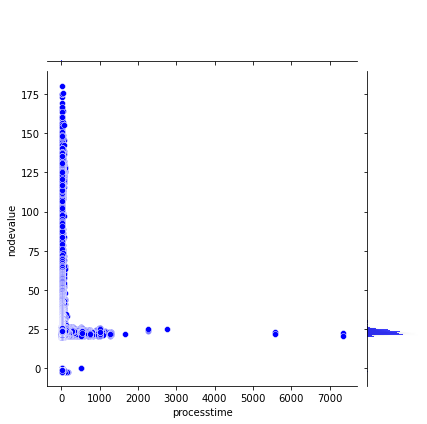

In [748]:
sns.jointplot(x='processtime',y='nodevalue',data=df2,color='blue')

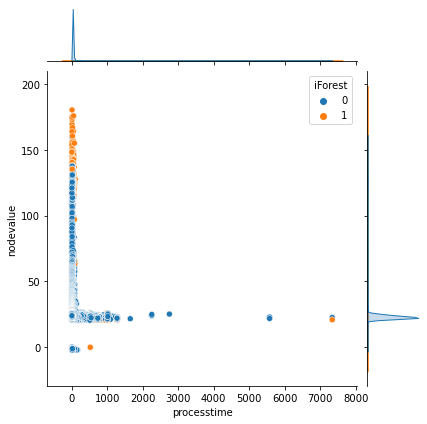

In [749]:
sns.jointplot(x='processtime',y='nodevalue',data=df2,color='blue', hue="iForest")

<Figure size 792x504 with 0 Axes>

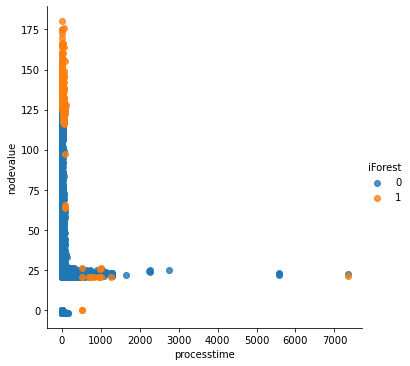

In [750]:
plt.figure(figsize=(11,7))
sns.lmplot(y='nodevalue',x='processtime',data=df2,hue='iForest',scatter=True, fit_reg=False)

In [751]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 551162 entries, 0 to 551161
Data columns (total 18 columns):
 #   Column              Non-Null Count   Dtype         
---  ------              --------------   -----         
 0   PRS_START_TIME      551162 non-null  datetime64[ns]
 1   PRS_END_TIME        551162 non-null  datetime64[ns]
 2   nodevalue           551162 non-null  float32       
 3   sourcetimestamp     551162 non-null  datetime64[ns]
 4   processtime         551162 non-null  float64       
 5   Handbetrieb         551162 non-null  uint8         
 6   Produktion          551162 non-null  uint8         
 7   Standby             551162 non-null  uint8         
 8   Stoerung            551162 non-null  uint8         
 9   TempIR_FStr_Linie1  551162 non-null  uint8         
 10  TempIR_FStr_Linie2  551162 non-null  uint8         
 11  TempIR_FStr_Linie3  551162 non-null  uint8         
 12  TempIR_FStr_Linie4  551162 non-null  uint8         
 13  TempIR_LStr_Linie1  551162 no

<AxesSubplot:>

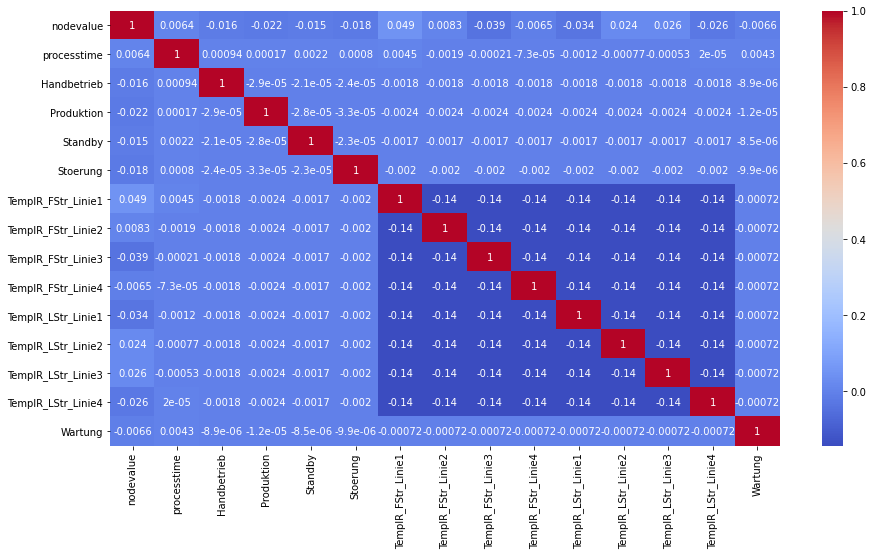

In [752]:
plt.figure(figsize=(15,8))
sns.heatmap(df.corr(),cmap='coolwarm',annot=True)

In [753]:
#time delta of internal time stamp and Orchestra time stamp

df2 = df
#correct sourcetimestamp by 2 hours, due to UTC - local time difference
df2["timedelta"] = df['PRS_START_TIME'] - (df['sourcetimestamp'] + datetime.timedelta(hours=2))
df2["timedelta"] = df2['timedelta']/np.timedelta64(1,'s')

max_value_timedelta = df2['timedelta'].nlargest(10)
print(str(max_value_timedelta) + "sec")

print("\t-----------------------------------------")
print("timedelta average in s (mean): " + str(df2["timedelta"].mean()))
print("timedelta average in s (median): " + str(df2["timedelta"].median()))


146319    34.075
146322    34.054
146317    34.042
146320    34.032
146321    34.032
146318    34.031
146315    34.028
146316    34.028
146325    29.075
146326    29.075
Name: timedelta, dtype: float64sec
	-----------------------------------------
timedelta average in s (mean): 2.520818848178855
timedelta average in s (median): 2.519


In [754]:
df2.head()

,PRS_START_TIME,PRS_END_TIME,nodevalue,sourcetimestamp,processtime,Handbetrieb,Produktion,Standby,Stoerung,TempIR_FStr_Linie1,TempIR_FStr_Linie2,TempIR_FStr_Linie3,TempIR_FStr_Linie4,TempIR_LStr_Linie1,TempIR_LStr_Linie2,TempIR_LStr_Linie3,TempIR_LStr_Linie4,Wartung,timedelta
0,2021-09-17 14:33:01.713,2021-09-17 14:33:01.727,24.878626,2021-09-17 12:33:01.417,14.0,0,0,0,0,0,0,0,1,0,0,0,0,0,0.296
1,2021-09-17 14:33:01.713,2021-09-17 14:33:01.727,25.461386,2021-09-17 12:33:01.417,14.0,0,0,0,0,0,0,0,0,0,0,1,0,0,0.296
2,2021-09-17 14:33:01.713,2021-09-17 14:33:01.727,26.012161,2021-09-17 12:33:01.416,14.0,0,0,0,0,1,0,0,0,0,0,0,0,0,0.297
3,2021-09-17 14:33:01.713,2021-09-17 14:33:01.743,24.235302,2021-09-17 12:33:01.417,30.0,0,0,0,0,0,0,1,0,0,0,0,0,0,0.296
4,2021-09-17 14:33:01.727,2021-09-17 14:33:01.743,25.300138,2021-09-17 12:33:01.417,16.0,0,0,0,0,0,1,0,0,0,0,0,0,0,0.310


In [780]:
#Stoerung analysis
#df1, df2 = [x for _, x in df.groupby(df['Sales'] < 30)]

df3 = df2[['Produktion', 'TempIR_LStr_Linie4']].copy()
df_temp = df2[['nodevalue']].copy()
df_temp['index'] = df_temp.index


df3 = df3.loc[~(df3==0).all(axis=1)]
df3['index'] = df3.index

df3=df3.merge(df_temp, on='index', how='left') 

df3 = df3.drop('index', axis=1)
df3 = df3.reset_index(drop=True)
df3['index'] = df3.index

df3['ProduktionStatus'] = df3['nodevalue']
df3.loc[(df3['ProduktionStatus'] > -1),'ProduktionStatus']=0
df3.loc[(df3['nodevalue'] == -1),'nodevalue']=-1
df3.loc[(df3['nodevalue'] == -2),'nodevalue']=100

df3.loc[(df3['ProduktionStatus'] == -1),'ProduktionStatus']=150
df3.loc[(df3['ProduktionStatus'] == -2),'ProduktionStatus']=200

print(df3['Produktion'].value_counts())
print(df3['nodevalue'].value_counts())
print(df3['ProduktionStatus'].value_counts())

#df4 = df2[['Produktion']].copy()
#df3 = df3[df3['TempIR_FStr_Linie1'] != 0]
#df3 = pd.concat([df3[df3['TempIR_FStr_Linie1'] != 0], df4], axis=1)
#df3 = df3.reset_index(drop=True)
#df3['index'] = df3.index

print(len(df3.index))
df3.head(10)

0    68886
1       22
Name: Produktion, dtype: int64
 100.000000    12
-1.000000      10
 21.380104      5
 21.270266      5
 21.403297      4
               ..
 21.484833      1
 21.168856      1
 23.197847      1
 21.569054      1
 21.267706      1
Name: nodevalue, Length: 65828, dtype: int64
0.0      68886
200.0       12
150.0       10
Name: ProduktionStatus, dtype: int64
68908


,Produktion,TempIR_LStr_Linie4,nodevalue,index,ProduktionStatus
0,0,1,24.417444,0,0.0
1,0,1,24.407387,1,0.0
2,0,1,24.421469,2,0.0
3,0,1,24.424278,3,0.0
4,0,1,24.432367,4,0.0
5,0,1,24.433121,5,0.0
6,0,1,24.444633,6,0.0
7,0,1,24.461779,7,0.0
8,0,1,24.465940,8,0.0
9,0,1,24.454483,9,0.0


<Figure size 792x504 with 0 Axes>

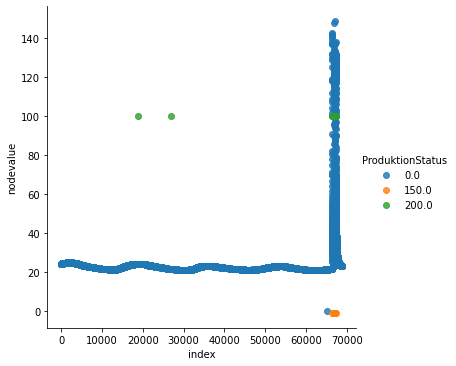

In [781]:
plt.figure(figsize=(11,7))
sns.lmplot(y='nodevalue',x='index',data=df3,hue='ProduktionStatus',scatter=True, fit_reg=False)

In [782]:
lastNodevalue = 0
lastProduktionState = 0

for index, row in df3.iterrows():
    if lastProduktionState == -5:
        if (row['nodevalue'] > (lastNodevalue) and lastNodevalue > 0):
            print("alert: " + str(lastProduktionState) + " + lastNode: " + str(lastNodevalue) + " - currentNode: " + str(row['nodevalue']) + " at index: " + str(row['index']))
    
    if row['ProduktionStatus'] != 0:
        lastProduktionState = row['ProduktionStatus']
    lastNodevalue = row['nodevalue']
    #print(currentProduktionState, currentNodevalue)

In [783]:
if False:
    !pip install plotly
    !pip install cufflinks

In [784]:
import plotly.express as px
df = px.data.tips()
fig = px.scatter(df3, y="nodevalue", x="index", color="ProduktionStatus")
fig.show()


In [786]:
import cufflinks as cf
cf.set_config_file(sharing='public',theme='pearl',offline=False)
cf.go_offline()

df3[['nodevalue', 'ProduktionStatus']].iplot(kind='scatter',xTitle='index',yTitle='nodevalue',title='Production Temperature Course')